# Dealing with Unbalanced Data

## 1 What is unbalanced data

When there is a classification problem and different catagories have great disparate numbers. We call the dataset 'imbalanced'. 

Tasks at real life include:
- Click-trhough rate prediction
- Fraud detection
- Disease diagnosis

For these kind of models. Although their positive samples are rare, they carry more useful information in the dataset. When we train the model, however, these important positive data could be underrepresented.

There are four kind of methods that could deal with these kind of problems.
- Over-sampling
- Under-sampling
- Changing loss function
- Transfer to anormal detection problem



## 2 Over-sampling - SMOTE

Synthetic Minority Over-sampling Technique (SMOTE) solves unbalanced problem by adding artificial minority sample to the dataset.
<img src="SMOTE1.png">
<img src="SMOTE2.png">

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [2]:
from sklearn.datasets import make_moons
from imblearn.datasets import make_imbalance
from collections import Counter

from sklearn.datasets import make_classification
from sklearn.svm import LinearSVC
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import *

from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import (SMOTE, BorderlineSMOTE, SVMSMOTE, SMOTENC,
                                    KMeansSMOTE)
from imblearn.over_sampling import RandomOverSampler
from imblearn.base import BaseSampler

from sklearn.base import is_regressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from matplotlib.colors import ListedColormap
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble.forest import BaseForest
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from sklearn.tree.tree import BaseDecisionTree
from sklearn.utils import check_random_state
from sklearn.utils import check_X_y
from sklearn.utils import check_array
from sklearn.preprocessing import binarize

from  warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

import warnings
warnings.filterwarnings('ignore')


In [3]:
def imbalance_train_test_split(X, y, test_size, random_state=None):
    '''Train/Test split that guarantee same class distribution between split datasets.'''
    X_maj = X[y==0]; y_maj = y[y==0]
    X_min = X[y==1]; y_min = y[y==1]
    X_train_maj, X_test_maj, y_train_maj, y_test_maj = train_test_split(
        X_maj, y_maj, test_size=test_size, random_state=random_state)
    X_train_min, X_test_min, y_train_min, y_test_min = train_test_split(
        X_min, y_min, test_size=test_size, random_state=random_state)
    X_train = np.concatenate([X_train_maj, X_train_min])
    X_test = np.concatenate([X_test_maj, X_test_min])
    y_train = np.concatenate([y_train_maj, y_train_min])
    y_test = np.concatenate([y_test_maj, y_test_min])
    return  X_train, X_test, y_train, y_test

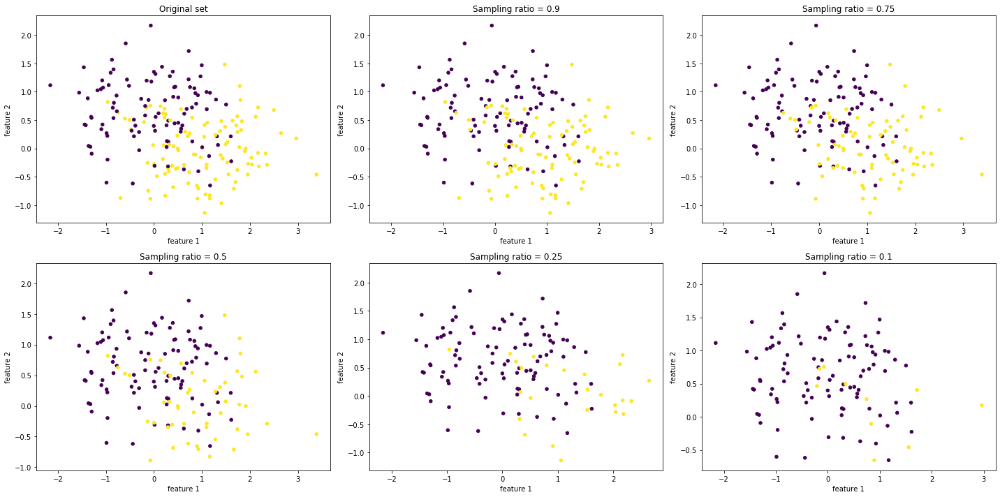

In [4]:
# Generate the dataset
X, y = make_moons(n_samples=200, shuffle=True, noise=0.5, random_state=10)
X = pd.DataFrame(X, columns=["feature 1", "feature 2"])


f, axs = plt.subplots(2, 3,figsize=(20, 10))


axs = [a for ax in axs for a in ax]

X.plot.scatter(
    x='feature 1', y='feature 2', c=y, ax=axs[0], colormap='viridis',
    colorbar=False
)
axs[0].set_title('Original set')


def ratio_func(y, multiplier, minority_class):
    target_stats = Counter(y)
    return {minority_class: int(multiplier * target_stats[minority_class])}


multipliers = [0.9, 0.75, 0.5, 0.25, 0.1]
for i, multiplier in enumerate(multipliers, start=1):
    ax = axs[i]

    X_, y_ = make_imbalance(X, y, sampling_strategy=ratio_func,
                            **{"multiplier": multiplier,
                               "minority_class": 1})
    
    X_ = pd.DataFrame(X_, columns=["feature 1", "feature 2"])
    X_.plot.scatter(
        x='feature 1', y='feature 2', c=y_, ax=ax, colormap='viridis',
        colorbar=False
    )
    ax.set_title('Sampling ratio = {}'.format(multiplier))

plt.tight_layout()
plt.show()


In [5]:
origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
origin_X = pd.DataFrame(origin_X, columns=["f1", "f2"])



In [6]:
umbal_X, umbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})
                               
umbal_X = pd.DataFrame(umbal_X, columns=["f1", "f2"])



(2000, 2)


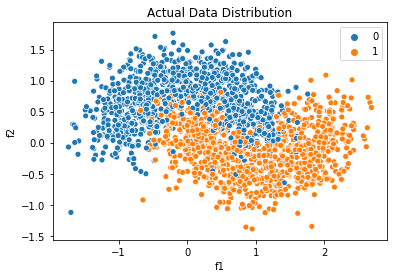

In [7]:
sns.scatterplot(x=origin_X['f1'],y=origin_X['f2'],hue=origin_y).set_title("Actual Data Distribution")
print(origin_X.shape)

(1100, 2)


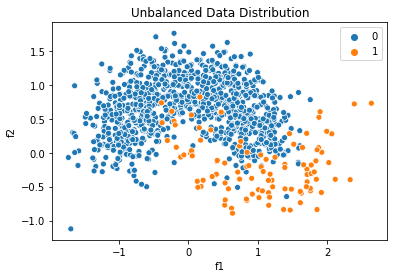

In [8]:
sns.scatterplot(x=umbal_X['f1'],y=umbal_X['f2'],hue=umbal_y).set_title("Unbalanced Data Distribution")
print(umbal_X.shape)

Text(0.5, 1.0, 'Resample using SMOTE')

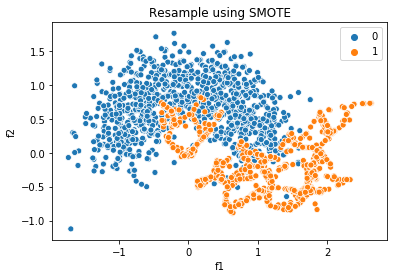

In [9]:
X_resampled, y_resampled = SMOTE(sampling_strategy='minority',random_state = 10).fit_resample(umbal_X, umbal_y)
X_resampled = pd.DataFrame(X_resampled, columns=["f1", "f2"])
sns.scatterplot(x=X_resampled['f1'],y=X_resampled['f2'],hue=y_resampled).set_title("Resample using SMOTE")

#### Without resample: Train

In [10]:
clf = MLPClassifier(hidden_layer_sizes=(10,10), activation="relu",
                 solver='sgd', alpha=0.0001,
                 batch_size='auto', learning_rate="constant",
                 learning_rate_init=0.001, power_t=0.5, max_iter=200 ,tol=1e-4)

In [11]:
def MLP():
    return MLPClassifier(hidden_layer_sizes=(25,20), activation="relu",
                 solver='sgd', alpha=0.0001,
                 batch_size='auto', learning_rate="constant",
                 learning_rate_init=0.001, power_t=0.5, max_iter=2000 ,tol=1e-4,random_state=10)

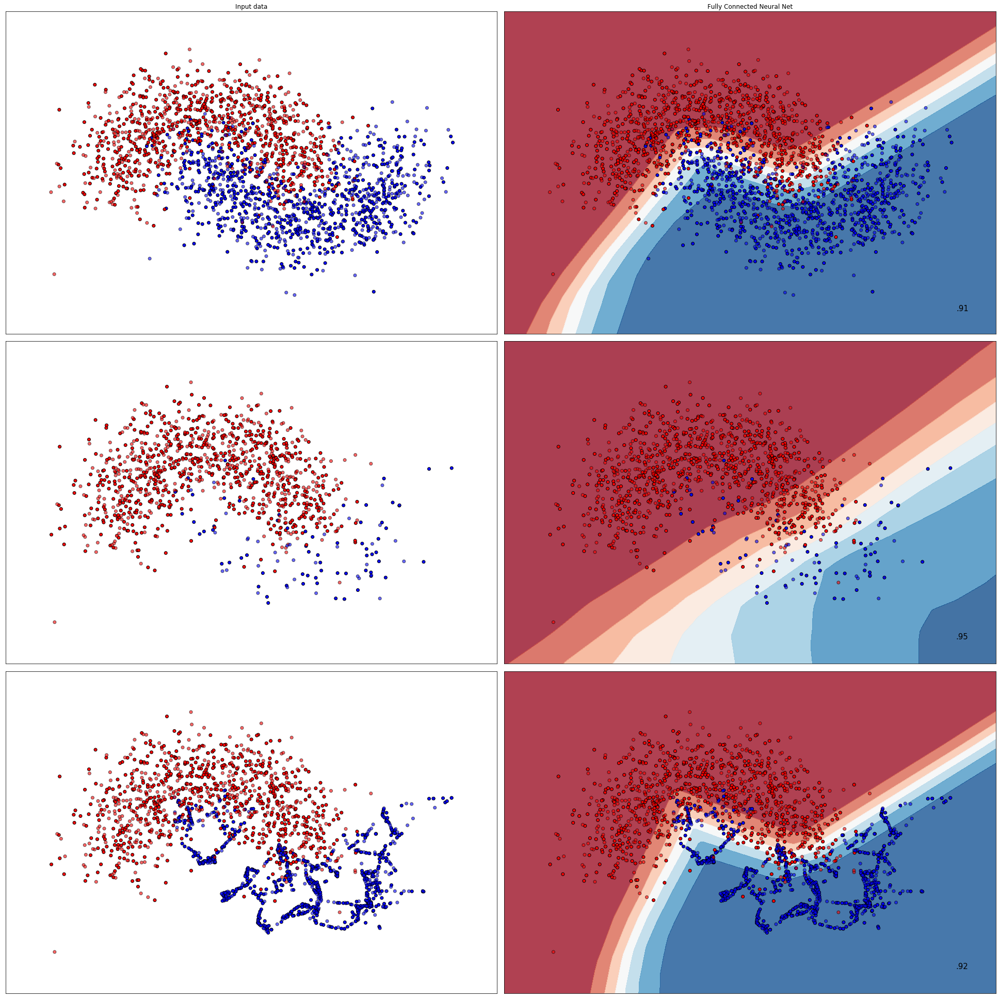

In [12]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net"]

classifiers = [

    MLP()
    
  
    ]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)



origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
umbal_X, umbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})
resp_X, resp_y = SMOTE(sampling_strategy='minority').fit_resample(umbal_X, umbal_y)




datasets = [(origin_X,origin_y),
            (umbal_X, umbal_y),
            (resp_X, resp_y)
            ]

figure = plt.figure(figsize=(27, 27))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    
    X, y = ds
    
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=42)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))


    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
   
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()
plt.show()

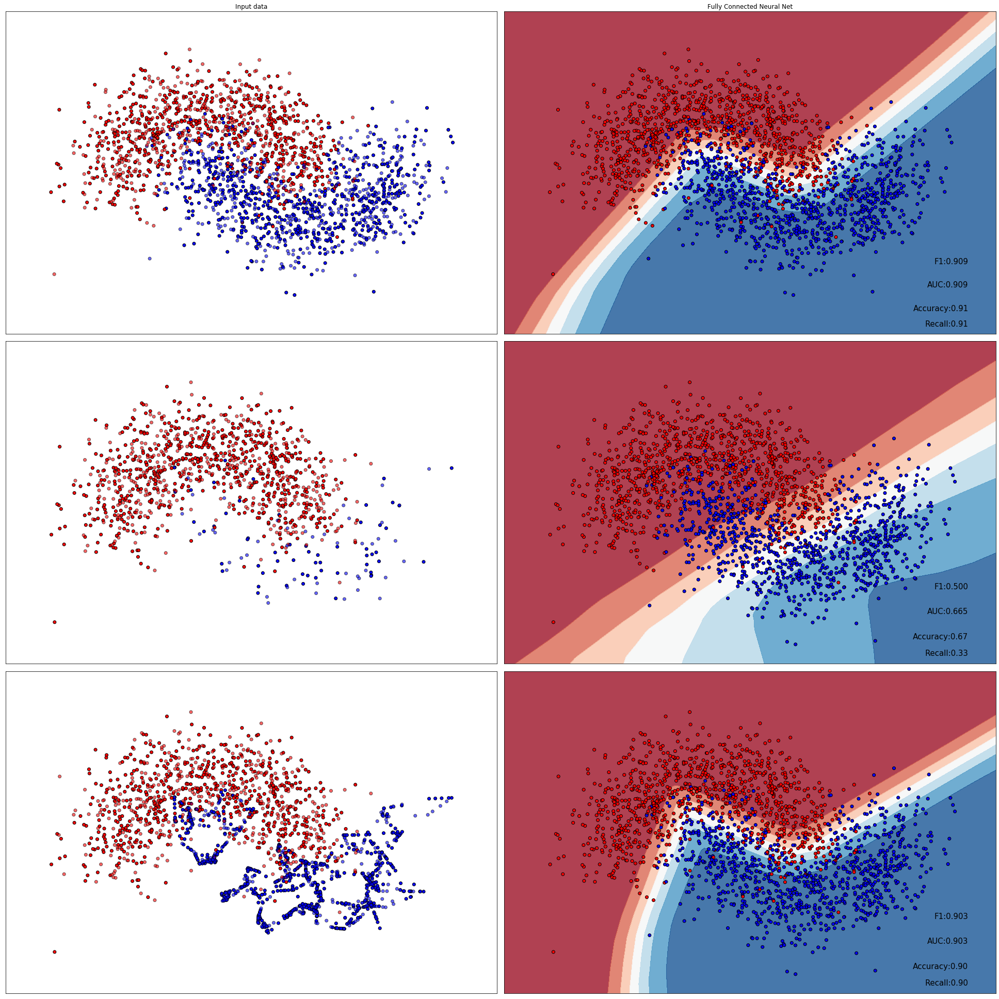

In [13]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net"]

classifiers = [
    MLP()  
    ]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)


origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
umbal_X, umbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})
resp_X, resp_y = SMOTE(sampling_strategy='minority').fit_resample(umbal_X, umbal_y)




datasets = [(origin_X,origin_y),
            (umbal_X, umbal_y),
            (resp_X, resp_y)
            ]

figure = plt.figure(figsize=(27, 27))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
   
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=43)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(origin_X, origin_y)

        auc = roc_auc_score(origin_y,clf.predict(origin_X))
        f1 = f1_score(origin_y,clf.predict(origin_X))
        prec, recall, fscore,sup = precision_recall_fscore_support(origin_y,clf.predict(origin_X))
        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        
        ax.scatter(origin_X[:, 0], origin_X[:, 1], c=origin_y, cmap=cm_bright,
                   edgecolors='k')
    

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
            
        ax.text(xx.max() - .3, yy.min() + .1 , 'Recall:'+('%.2f' % recall[1]),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .3, 'Accuracy:'+('%.2f' % score),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .6, 'AUC:'+('%.3f' % auc),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .9, 'F1:'+('%.3f' % f1),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()
plt.show()

SMOTE: ROC AUC=0.971
Unbalanced: ROC AUC=0.938


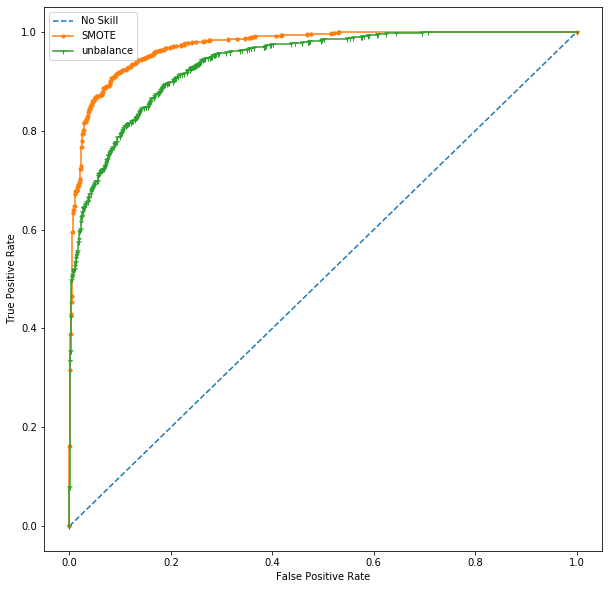

In [14]:
ns_probs = [0 for _ in range(len(origin_X))]

clf1 = MLP()
clf1.fit(resp_X, resp_y)

lr_probs = clf1.predict_proba(origin_X)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(origin_y, ns_probs)
lr_auc = roc_auc_score(origin_y, clf1.predict_proba(origin_X)[:,1])

print('SMOTE: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(origin_y, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(origin_y, clf1.predict_proba(origin_X)[:,1])
# plot the roc curve for the model
plt.figure(figsize=(10,10))
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='SMOTE')


#################
clf2 = MLP()
clf2.fit(umbal_X, umbal_y)
lr_probs = clf2.predict_proba(origin_X)
prec, recall, fscore,sup = precision_recall_fscore_support(origin_y,clf2.predict(origin_X))


lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(origin_y, ns_probs)
lr_auc = roc_auc_score(origin_y, clf2.predict_proba(origin_X)[:,1])



print('Unbalanced: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
lr_fpr, lr_tpr, _ = roc_curve(origin_y, clf2.predict_proba(origin_X)[:,1])
# plot the roc curve for the model
plt.plot(lr_fpr, lr_tpr, marker='1', label='unbalance')



# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

From what we seen above, the SMOTE technic could deal with the issue of imbalanced data and improve model performance.

SMOTE technic create new information for the minority data that could make the classifier easier to make a boundry between the majority and the minority

# 3 Under-sampling - Tomek link

In [15]:
from imblearn.under_sampling import TomekLinks

rng = np.random.RandomState(18)

In [16]:
def make_plot_despine(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.set_xlim([0., 3.5])
    ax.set_ylim([0., 3.5])
    ax.set_xlabel(r'$X_1$')
    ax.set_ylabel(r'$X_2$')
    ax.legend()

Generate some data with one Tomek link

In [17]:
# minority class
X_minority = np.transpose([[1.1, 1.3, 1.15, 0.8, 0.55, 2.1],
                           [1., 1.5, 1.7, 2.5, 0.55, 1.9]])
# majority class
X_majority = np.transpose([[2.1, 2.12, 2.13, 2.14, 2.2, 2.3, 2.5, 2.45],
                           [1.5, 2.1, 2.7, 0.9, 1.0, 1.4, 2.4, 2.9]])

In the figure above, the samples highlighted in green form a Tomek link since they are of different classes and are nearest neighbours of each other.

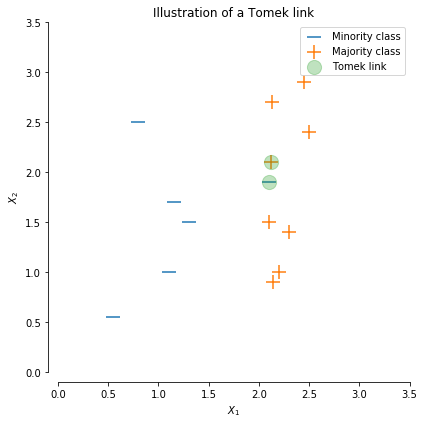

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.scatter(X_minority[:, 0], X_minority[:, 1],
           label='Minority class', s=200, marker='_')
ax.scatter(X_majority[:, 0], X_majority[:, 1],
           label='Majority class', s=200, marker='+')


ax.scatter([X_minority[-1, 0], X_majority[1, 0]],
           [X_minority[-1, 1], X_majority[1, 1]],
           label='Tomek link', s=200, alpha=0.3)
ax.set_title('Illustration of a Tomek link')
make_plot_despine(ax)
fig.tight_layout()

We can run the TomekLinks sampling to remove the corresponding samples. If sampling_strategy='auto' only the sample from the majority class will be removed. If sampling_strategy='all' both samples will be removed.

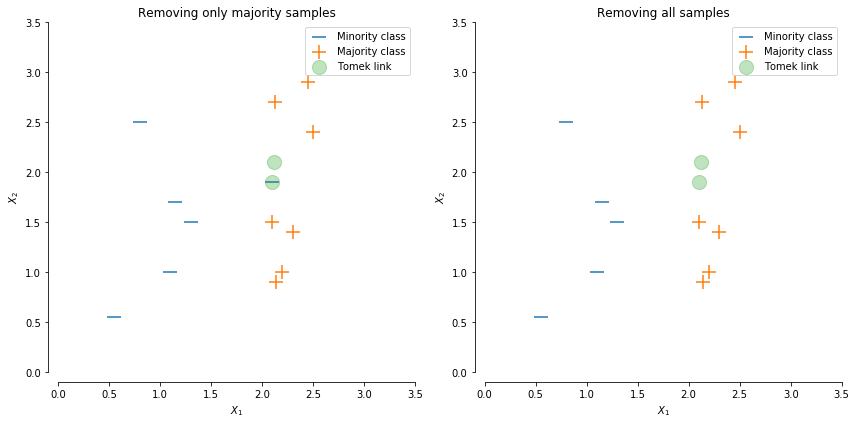

In [19]:
sampler = TomekLinks(random_state = 10)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax_arr = (ax1, ax2)
title_arr = ('Removing only majority samples',
             'Removing all samples')
for ax, title, sampler in zip(ax_arr,
                              title_arr,
                              [TomekLinks(sampling_strategy='auto'),
                               TomekLinks(sampling_strategy='all')]):
    X_res, y_res = sampler.fit_resample(np.vstack((X_minority, X_majority)),
                                        np.array([0] * X_minority.shape[0] +
                                                 [1] * X_majority.shape[0]))
    ax.scatter(X_res[y_res == 0][:, 0], X_res[y_res == 0][:, 1],
               label='Minority class', s=200, marker='_')
    ax.scatter(X_res[y_res == 1][:, 0], X_res[y_res == 1][:, 1],
               label='Majority class', s=200, marker='+')

    # highlight the samples of interest
    ax.scatter([X_minority[-1, 0], X_majority[1, 0]],
               [X_minority[-1, 1], X_majority[1, 1]],
               label='Tomek link', s=200, alpha=0.3)

    ax.set_title(title)
    make_plot_despine(ax)
fig.tight_layout()

plt.show()

In [20]:
origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
origin_X = pd.DataFrame(origin_X, columns=["f1", "f2"])

umbal_X, umbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})
                               
umbal_X = pd.DataFrame(umbal_X, columns=["f1", "f2"])



resp_X, resp_y = sampler.fit_resample(origin_X, origin_y)
resp_X = pd.DataFrame(resp_X, columns=["f1", "f2"])



(1100, 2)
(1862, 2)


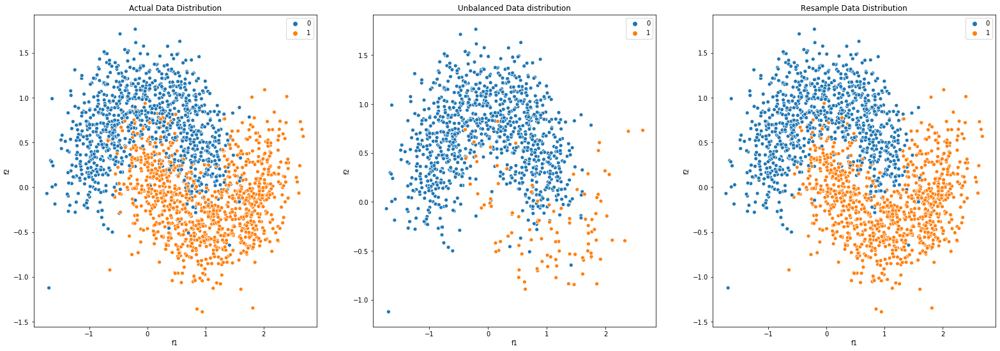

In [21]:

fig, ax =plt.subplots(1,3,figsize=(27, 9))

sns.scatterplot(x=origin_X['f1'],y=origin_X['f2'],hue=origin_y,ax=ax[0]).set_title("Actual Data Distribution")
sns.scatterplot(x=umbal_X['f1'],y=umbal_X['f2'],hue=umbal_y,ax=ax[1]).set_title("Unbalanced Data distribution")
sns.scatterplot(x=resp_X['f1'],y=resp_X['f2'],hue=resp_y,ax=ax[2]).set_title("Resample Data Distribution")
print(umbal_X.shape)
print(resp_X.shape)

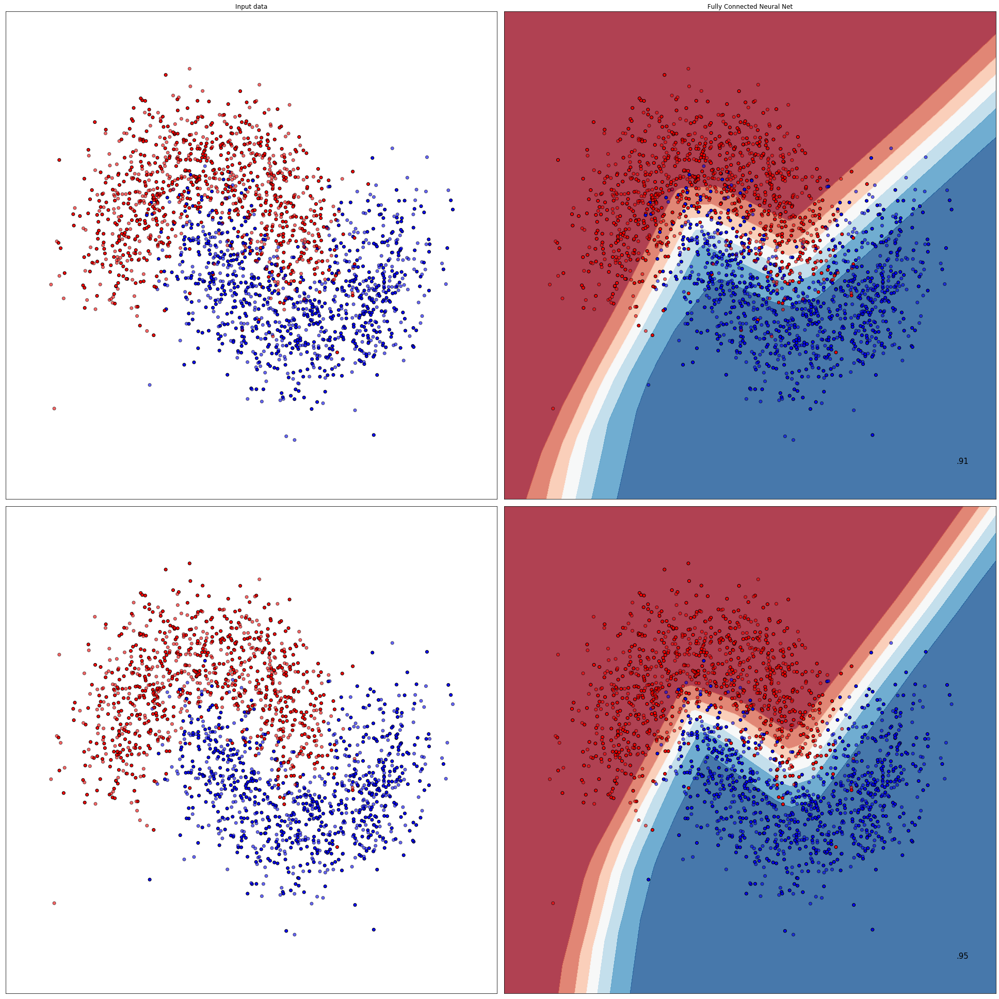

In [22]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net"]

classifiers = [

    MLP()
  
    ]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)



origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)

resp_X, resp_y = sampler.fit_resample(origin_X, origin_y)




datasets = [(origin_X,origin_y),
            (resp_X, resp_y)
            ]

figure = plt.figure(figsize=(27, 27))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    
    X, y = ds
    
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=42)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))


    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
   
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()
plt.show()

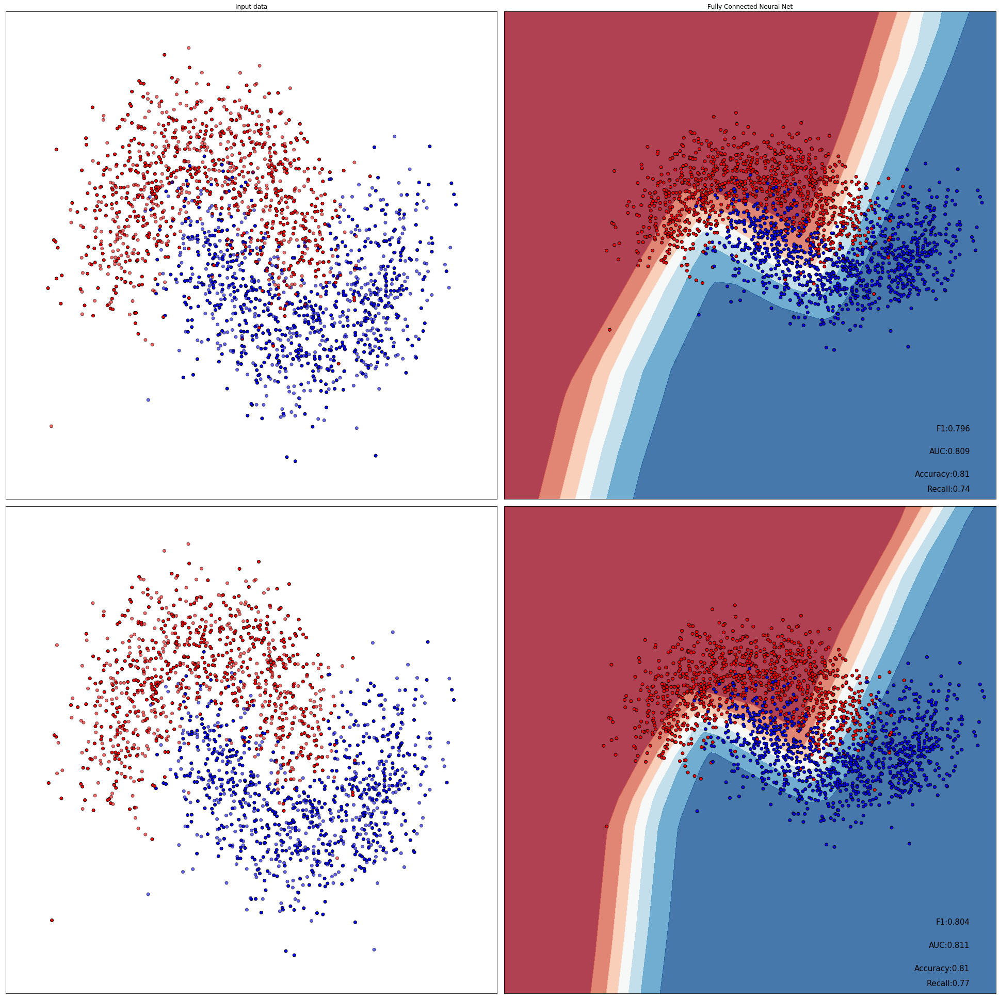

In [23]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net"]

classifiers = [
    MLP()
    ]

X, y = make_classification(n_features=2, n_redundant=0, n_informative=2,
                           random_state=1, n_clusters_per_class=1)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)


origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
resp_X, resp_y = sampler.fit_resample(origin_X, origin_y)




datasets = [(origin_X,origin_y),

            (resp_X, resp_y)
            ]

figure = plt.figure(figsize=(27, 27))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    X = StandardScaler().fit_transform(X)
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.4, random_state=43)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        score = clf.score(origin_X, origin_y)

        auc = roc_auc_score(origin_y,clf.predict(origin_X))
        f1 = f1_score(origin_y,clf.predict(origin_X))
        prec, recall, fscore,sup = precision_recall_fscore_support(origin_y,clf.predict(origin_X))
        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        
        ax.scatter(origin_X[:, 0], origin_X[:, 1], c=origin_y, cmap=cm_bright,
                   edgecolors='k')
    

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
            
        ax.text(xx.max() - .3, yy.min() + .1 , 'Recall:'+('%.2f' % recall[1]),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .3, 'Accuracy:'+('%.2f' % score),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .6, 'AUC:'+('%.3f' % auc),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .9, 'F1:'+('%.3f' % f1),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()
plt.show()

Tomek link's method only removes very few majority samples and does not make significant change of the model. But it improves the performance of origin data.

# 4 Ensemble Methods

This group of methods concentrates on merging one of the data-level or algorithm-level solu- tions with an ensemble learning method. Most of them are based on a canonical ensemble learning algorithm with an imbalance learning algorithm embedded in the pipeline, e.g., SMOTE + Adaptive Boosting = SMOTEBoost.

SMOTEBoost applies SMOTE to generate |P| new synthetic minority samples within each iteration of AdaBoost pipeline.

SMOTEBagging, which applies SMOTE to get each bag for Bagging, where each bag’s sample quantity varies.

In [24]:
from imblearn.over_sampling import SMOTE as SMOTE_IMB

class SMOTE(object):
    

    def __init__(self, k_neighbors=5, random_state=10):
        self.k = k_neighbors
        self.random_state = random_state

    def sample(self, n_samples):
        
        np.random.seed(seed=self.random_state)

        S = np.zeros(shape=(n_samples, self.n_features))
        # Calculate synthetic samples.
        for i in range(n_samples):
            j = np.random.randint(0, self.X.shape[0])

            # Find the NN for each sample.
            # Exclude the sample itself.
            nn = self.neigh.kneighbors(self.X[j].reshape(1, -1),
                                       return_distance=False)[:, 1:]
            nn_index = np.random.choice(nn[0])

            dif = self.X[nn_index] - self.X[j]
            gap = np.random.random()

            S[i, :] = self.X[j, :] + gap * dif[:]

        return S

    def fit(self, X):
        
        self.X = X
        self.n_minority_samples, self.n_features = self.X.shape

        
        self.neigh = NearestNeighbors(n_neighbors=self.k + 1)
        self.neigh.fit(self.X)

        return self


class SMOTEBoost(AdaBoostClassifier):
    

    def __init__(self,
                 n_samples=100,
                 k_neighbors=5,
                 base_estimator=None,
                 n_estimators=50,
                 learning_rate=1.,
                 algorithm='SAMME.R',
                 random_state=10):

        self.n_samples = n_samples
        self.algorithm = algorithm
        self.smote = SMOTE(k_neighbors=k_neighbors,
                           random_state=random_state)

        super(SMOTEBoost, self).__init__(
            base_estimator=base_estimator,
            n_estimators=n_estimators,
            learning_rate=learning_rate,
            random_state=random_state)

    def fit(self, X, y, sample_weight=None, minority_target=1):
        """Build a boosted classifier/regressor from the training set (X, y),
        
        minority_target : int
            Minority class label.
   
        """
        # Check that algorithm is supported.
        if self.algorithm not in ('SAMME', 'SAMME.R'):
            raise ValueError("algorithm %s is not supported" % self.algorithm)

        # Check parameters.
        if self.learning_rate <= 0:
            raise ValueError("learning_rate must be greater than zero")

        if (self.base_estimator is None or
                isinstance(self.base_estimator, (BaseDecisionTree,
                                                 BaseForest))):
            DTYPE = np.float64  # from fast_dict.pxd
            dtype = DTYPE
            accept_sparse = 'csc'
        else:
            dtype = None
            accept_sparse = ['csr', 'csc']

        X, y = check_X_y(X, y, accept_sparse=accept_sparse, dtype=dtype,
                         y_numeric=is_regressor(self))

        if sample_weight is None:
            # Initialize weights to 1 / n_samples.
            sample_weight = np.empty(X.shape[0], dtype=np.float64)
            sample_weight[:] = 1. / X.shape[0]
        else:
            sample_weight = check_array(sample_weight, ensure_2d=False)
            # Normalize existing weights.
            sample_weight = sample_weight / sample_weight.sum(dtype=np.float64)

            
            if sample_weight.sum() <= 0:
                raise ValueError(
                    "Attempting to fit with a non-positive "
                    "weighted number of samples.")

        if minority_target is None:
            # Determine the minority class label.
            stats_c_ = Counter(y)
            maj_c_ = max(stats_c_, key=stats_c_.get)
            min_c_ = min(stats_c_, key=stats_c_.get)
            self.minority_target = min_c_
        else:
            self.minority_target = minority_target

        # Check parameters.
        self._validate_estimator()

        # Clear any previous fit results.
        self.estimators_ = []
        self.estimator_weights_ = np.zeros(self.n_estimators, dtype=np.float64)
        self.estimator_errors_ = np.ones(self.n_estimators, dtype=np.float64)

        random_state = check_random_state(self.random_state)

        for iboost in range(self.n_estimators):
            
            X_min = X[np.where(y == self.minority_target)]
            self.smote.fit(X_min)
            X_syn = self.smote.sample(self.n_samples)
            y_syn = np.full(X_syn.shape[0], fill_value=self.minority_target,
                            dtype=np.int64)

            # Normalize synthetic sample weights based on current training set.
            sample_weight_syn = np.empty(X_syn.shape[0], dtype=np.float64)
            sample_weight_syn[:] = 1. / X.shape[0]

            # print ('Boosting Iter: {} n_train: {} n_smote: {}'.format(
            #     iboost, len(X_min), len(y_syn)))

            # Combine the original and synthetic samples.
            X = np.vstack((X, X_syn))
            y = np.append(y, y_syn)

           
            sample_weight = \
                np.append(sample_weight, sample_weight_syn).reshape(-1, 1)
            sample_weight = \
                np.squeeze(normalize(sample_weight, axis=0, norm='l1'))

            # X, y, sample_weight = shuffle(X, y, sample_weight,
            #                              random_state=random_state)

            # Boosting step.
            sample_weight, estimator_weight, estimator_error = self._boost(
                iboost,
                X, y,
                sample_weight,
                random_state)

            # Early termination.
            if sample_weight is None:
                print('sample_weight: {}'.format(sample_weight))
                break

            self.estimator_weights_[iboost] = estimator_weight
            self.estimator_errors_[iboost] = estimator_error

            # Stop if error is zero.
            # if estimator_error == 0:
            #     print('error: {}'.format(estimator_error))
            #     break

            sample_weight_sum = np.sum(sample_weight)

            # Stop if the sum of sample weights has become non-positive.
            if sample_weight_sum <= 0:
                print('sample_weight_sum: {}'.format(sample_weight_sum))
                break

            if iboost < self.n_estimators - 1:
                # Normalize.
                sample_weight /= sample_weight_sum

        return self
    

    
class SMOTEBagging():
    def __init__(self,
                 n_samples=100,
                 min_ratio=1.0,
                 with_replacement=True,
                 base_estimator=None,
                 n_estimators=10,
                 learning_rate=1.,
                 algorithm='SAMME.R',
                 random_state=None):
        self.n_estimators = n_estimators
        self.model_list = []
    
    def fit(self, X, y):
        self.model_list = []
        df = pd.DataFrame(X); df['label'] = y
        df_maj = df[df['label']==0]; n_maj = len(df_maj)
        df_min = df[df['label']==1]; n_min = len(df_min)
        cols = df.columns.tolist(); cols.remove('label')
        for ibagging in range(self.n_estimators):
            b = min(0.1*((ibagging%10)+1), 1)
            train_maj = df_maj.sample(frac=b, replace=True)
            train_min = df_min.sample(frac=b, replace=True)
            # train_maj = df_maj.sample(frac=1/self.n_estimators, replace=True)
            # train_min = df_min.sample(frac=1/self.n_estimators, replace=True)
            # train_maj = df_maj.sample(n=n_min, replace=True)
            # train_min = df_min.sample(frac=1/self.n_estimators, replace=True)
            df_k = train_maj.append(train_min)
            X_train, y_train = SMOTE_IMB(k_neighbors=min(5, len(train_min)-1)).fit_resample(df_k[cols], df_k['label'])
            # print ('Bagging Iter: {} |b: {:.1f}|n_train: {}|n_smote: {}'.format(
            #     ibagging, b, len(y_train), len(y_train)-len(df_k)))
            model = DecisionTreeClassifier().fit(X_train, y_train)
            self.model_list.append(model)
        return self
    
    def predict_proba(self, X):
        y_pred = np.array([model.predict(X) for model in self.model_list]).mean(axis=0)
        if y_pred.ndim == 1:
            y_pred = y_pred[:, np.newaxis]
        if y_pred.shape[1] == 1:
            y_pred = np.append(1-y_pred, y_pred, axis=1)
        return y_pred
    
    def predict(self, X):
        y_pred_binarazed = binarize(self.predict_proba(X)[:,1].reshape(1,-1), threshold=0.5)[0]
        return y_pred_binarazed

In [25]:
origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
unbal_X, unbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})
origin_X_train, origin_X_test, origin_y_train, origin_y_test = imbalance_train_test_split(origin_X, origin_y, 0.2, random_state=10)
unbal_X_train, unbal_X_test, unbal_y_train, unbal_y_test = imbalance_train_test_split(unbal_X, unbal_y, 0.2, random_state=10)



In [26]:
clf =AdaBoostClassifier ()
clf.fit(origin_X_train,origin_y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=None)

In [27]:
clf.score(origin_X_test,origin_y_test)

0.905

In [28]:
clf.fit(unbal_X_train, unbal_y_train)
clf.score(unbal_X_test,unbal_y_test)

0.9545454545454546

In [29]:
modelSMOTEBoost = SMOTEBoost(base_estimator = DecisionTreeClassifier(), n_estimators = 5)

In [30]:
modelSMOTEBoost.fit(umbal_X, umbal_y, sample_weight=None, minority_target=1)

SMOTEBoost(algorithm='SAMME.R',
           base_estimator=DecisionTreeClassifier(class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 presort=False,
                                                 random_state=None,
                                                 splitter='best'),
           k_neighbors=None, learning_rate=1.0, n_estimators=5,

In [31]:
modelSMOTEBoost.score(origin_X,origin_y)

0.8785

In [32]:
modelSMOTEBagging = SMOTEBagging(base_estimator = MLP())

In [33]:
print(unbal_y.sum(),origin_y.sum())
unbal_X = StandardScaler().fit_transform(unbal_X)
modelSMOTEBagging.fit(unbal_X, unbal_y)
accuracy_score(origin_y, modelSMOTEBagging.predict(origin_X))

100 1000


0.5895

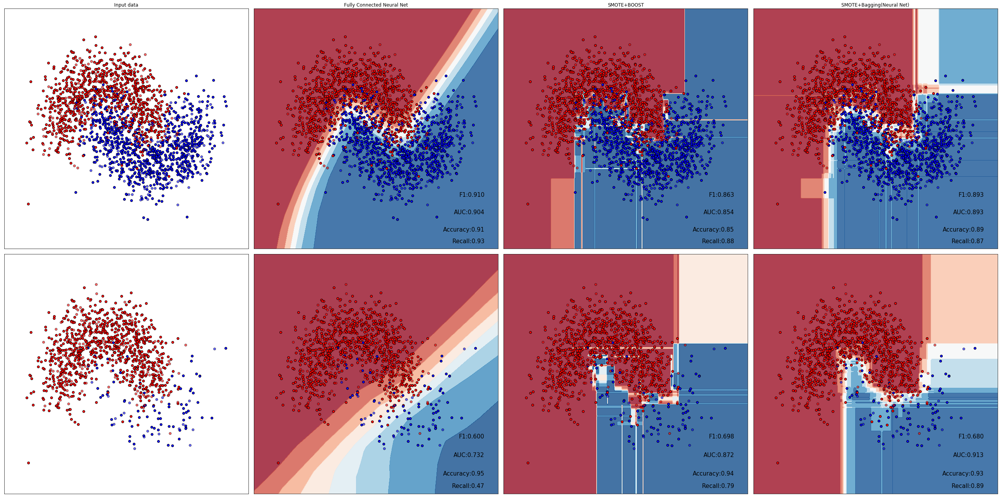

In [34]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net","SMOTE+BOOST","SMOTE+Bagging(Neural Net)"]

classifiers = [
    MLP(),
    SMOTEBoost(base_estimator = DecisionTreeClassifier(), n_estimators = 5),
    SMOTEBagging(base_estimator = MLP())
    ]


origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
unbal_X, unbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})

datasets = [(origin_X,origin_y),
            (unbal_X, unbal_y)
            ]

figure = plt.figure(figsize=(36, 18))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    
    X_train, X_test, y_train, y_test = \
        train_test_split(X, y, test_size=.2, random_state=43)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        clf.fit(X_train, y_train)
        
        score = accuracy_score(y_test, clf.predict(X_test))
        auc = roc_auc_score(y_test,clf.predict(X_test))
        f1 = f1_score(y_test,clf.predict(X_test))
        prec, recall, fscore,sup = precision_recall_fscore_support(y_test,clf.predict(X_test))
        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # Plot the testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)
    

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
            
        ax.text(xx.max() - .3, yy.min() + .1 , 'Recall:'+('%.2f' % recall[1]),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .3, 'Accuracy:'+('%.2f' % score),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .6, 'AUC:'+('%.3f' % auc),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .9, 'F1:'+('%.3f' % f1),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()

plt.show()

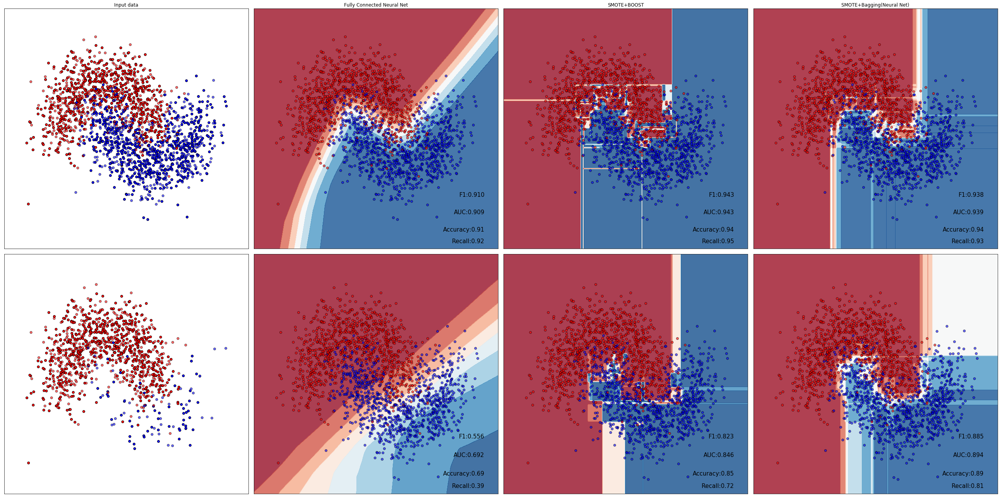

In [35]:
h = .02  # step size in the mesh

names = ["Fully Connected Neural Net","SMOTE+BOOST","SMOTE+Bagging(Neural Net)"]

classifiers = [
    MLP(),
    SMOTEBoost(base_estimator = DecisionTreeClassifier(), n_estimators = 5),
    SMOTEBagging(base_estimator = MLP())
    ]

origin_X, origin_y = make_moons(n_samples=2000, shuffle=True, noise=0.3, random_state=6)
unbal_X, unbal_y = make_imbalance(origin_X, origin_y, sampling_strategy=ratio_func,random_state=10,
                            **{"multiplier": 0.1,
                               "minority_class": 1})



datasets = [(origin_X,origin_y),
            (unbal_X, unbal_y)
            ]

figure = plt.figure(figsize=(36, 18))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    
    X_train, X_test, y_train, y_test = \
        imbalance_train_test_split(X, y, test_size=.4, random_state=43)

    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
               edgecolors='k')
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
               edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        
        clf.fit(X_train, y_train)
        #print(y_train.sum(),origin_y.sum())
        
        score = accuracy_score(origin_y, clf.predict(origin_X))
        auc = roc_auc_score(origin_y,clf.predict(origin_X))
        f1 = f1_score(origin_y,clf.predict(origin_X))
        prec, recall, fscore,sup = precision_recall_fscore_support(origin_y,clf.predict(origin_X))
        
        if hasattr(clf, "decision_function"):
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]

        
        Z = Z.reshape(xx.shape)
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)

        
       
        # Plot the testing points
        ax.scatter(origin_X[:, 0], origin_X[:, 1], c=origin_y, cmap=cm_bright,
                   edgecolors='k', alpha=0.6)
    

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
            
        ax.text(xx.max() - .3, yy.min() + .1 , 'Recall:'+('%.2f' % recall[1]),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .3, 'Accuracy:'+('%.2f' % score),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .6, 'AUC:'+('%.3f' % auc),
                size=15, horizontalalignment='right')
        
        ax.text(xx.max() - .3, yy.min() + .9, 'F1:'+('%.3f' % f1),
                size=15, horizontalalignment='right')
        i += 1

        
plt.tight_layout()

plt.show()

In [36]:
cls = MLPClassifier(hidden_layer_sizes=(25,20), activation="relu",
                 solver='sgd', alpha=0.0001,
                 batch_size='auto', learning_rate="constant",
                 learning_rate_init=0.001, power_t=0.5, max_iter=2000 ,tol=1e-4,random_state=10)
X_train, X_test, y_train, y_test = \
        imbalance_train_test_split(unbal_X, unbal_y, test_size=.4, random_state=43)
cls.fit(X_train,y_train)
cls.predict(X_train).sum()

33